In [1]:
import zipfile
import os

# Path to the ZIP file on your local system
local_zip_path = '/content/data set of voice.zip'  # Change this to your local file path

# Filename to save the downloaded ZIP file
file_name = '/content/data set of voice.zip'

# Copy the local file to the current directory with the new file name
if os.path.exists(local_zip_path):
    os.rename(local_zip_path, file_name)

# Extract the contents of the downloaded ZIP file into a directory
extract_path = 'extracted_folder'  # Change 'extracted_folder' to your desired extraction path

# Create the extraction directory if it doesn't exist
if not os.path.exists(extract_path):
    os.makedirs(extract_path)

# Extract the ZIP file contents
with zipfile.ZipFile(file_name, 'r') as zip_ref:
    zip_ref.extractall(extract_path)

print('File extracted successfully')

File extracted successfully


In [2]:
import numpy as np
import pandas as pd
import os
import shutil
import matplotlib.pyplot as plt
import numpy as np


In [3]:
# Output directory to clear
output_dir = "/kaggle/working/combined_files"

# Clear the contents of the output directory
shutil.rmtree(output_dir, ignore_errors=True)
os.makedirs(output_dir, exist_ok=True)

print(f"Contents of {output_dir} cleared.")

Contents of /kaggle/working/combined_files cleared.


In [7]:
import librosa
import soundfile as sf

# Path to the dataset
dataset_path = "/content/extracted_folder/archive (2)/16000_pcm_speeches"

# Output directory to save the combined files
output_dir = "/kaggle/working/combined_files"

# Create the output directory if it doesn't exist
os.makedirs(output_dir, exist_ok=True)

# List of speaker folders
speaker_folders = [
    "Jens_Stoltenberg",
    "Julia_Gillard",
    "Magaret_Tarcher",
    "Nelson_Mandela"
]

# Number of files to combine for each speaker
num_files_to_combine = 120

# Iterate over each speaker's folder
for speaker_folder in speaker_folders:
    speaker_folder_path = os.path.join(dataset_path, speaker_folder)

    # List the first num_files_to_combine WAV files in the speaker's folder
    wav_files = [f"{i}.wav" for i in range(num_files_to_combine)]

    # Combine all WAV files into a single long file
    combined_audio = []
    for wav_file in wav_files:
        wav_file_path = os.path.join(speaker_folder_path, wav_file)
        audio, sr = librosa.load(wav_file_path, sr=None)
        combined_audio.extend(audio)

    # Save the combined audio file
    output_file_path = os.path.join(output_dir, f"{speaker_folder}_combined.wav")
    sf.write(output_file_path, combined_audio, sr)

print("Combination complete. Combined files saved in:", output_dir)

Combination complete. Combined files saved in: /kaggle/working/combined_files


In [8]:
from IPython.display import display, Audio

# Function to play audio file
def play_audio(audio_path):
    display(Audio(filename=audio_path))

# Play a specific combined audio file
speaker_folder = "Julia_Gillard_combined"
audio_path = os.path.join(output_dir, f"{speaker_folder}.wav")
print(f"Click the play button to listen: {audio_path}")
play_audio(audio_path)

Click the play button to listen: /kaggle/working/combined_files/Julia_Gillard_combined.wav


In [9]:
# Function to play audio file
def play_audio(audio_path):
    display(Audio(filename=audio_path))

# Play a specific combined audio file
speaker_folder = "Nelson_Mandela_combined"
audio_path = os.path.join(output_dir, f"{speaker_folder}.wav")
print(f"Click the play button to listen: {audio_path}")
play_audio(audio_path)

Click the play button to listen: /kaggle/working/combined_files/Nelson_Mandela_combined.wav


<ipython-input-24-c935ee5d06f9>:19: UserWarning: amplitude_to_db was called on complex input so phase information will be discarded. To suppress this warning, call amplitude_to_db(np.abs(S)) instead.
  D = librosa.amplitude_to_db(librosa.stft(y), ref=np.max)


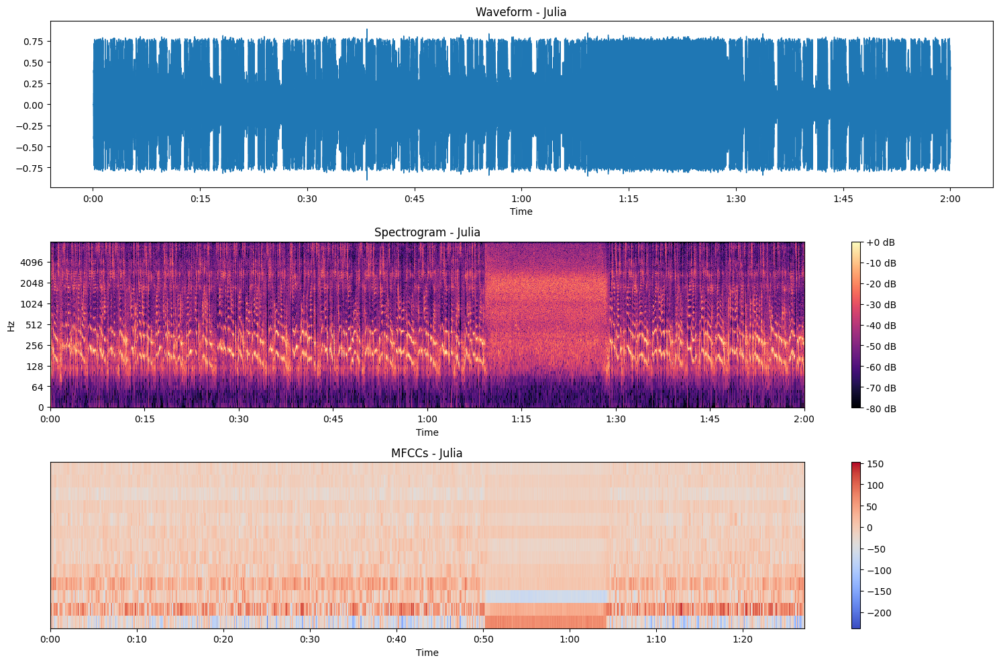

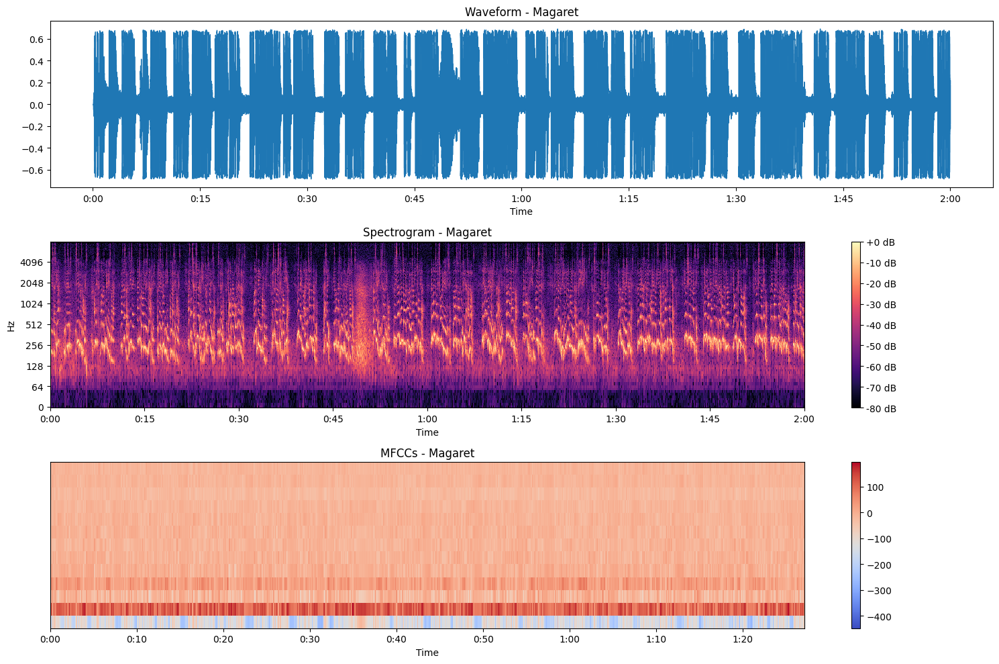

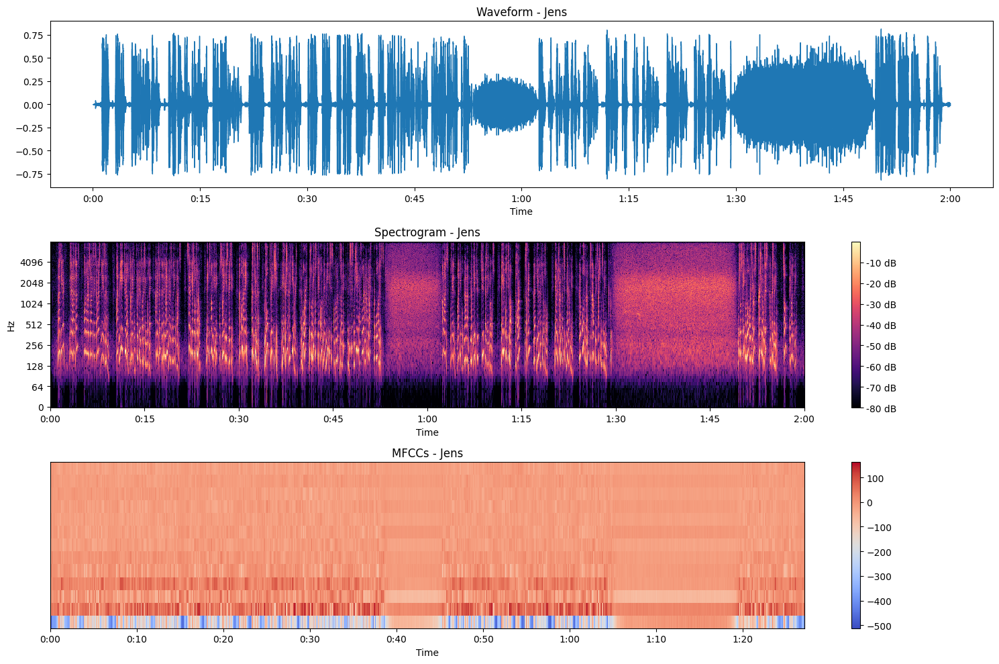

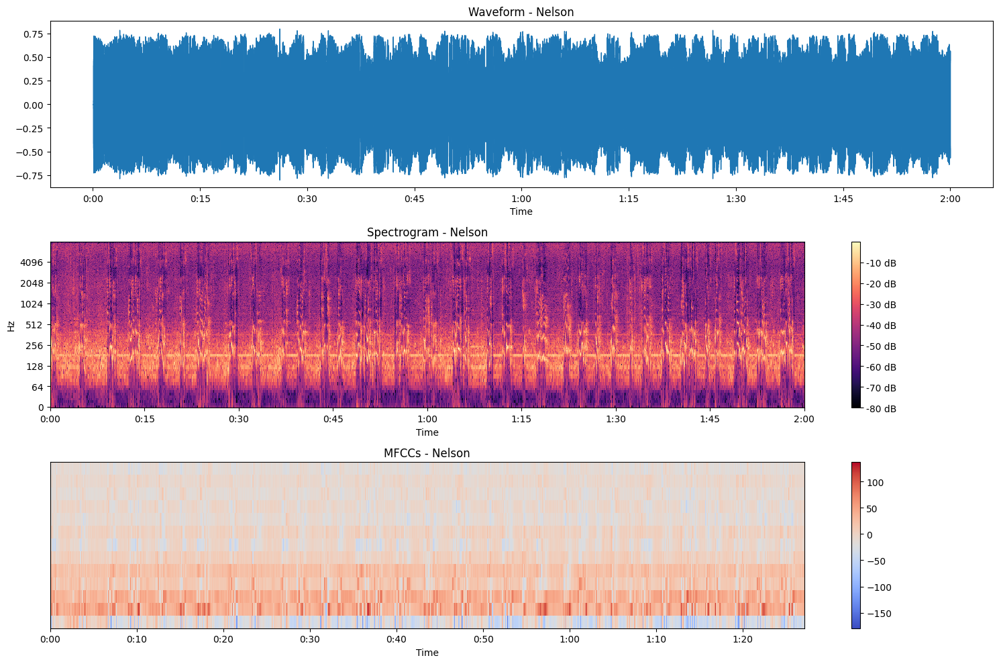

In [24]:
import librosa.display

# Function to plot the waveform, spectrogram, and MFCCs
def plot_audio_features(audio_path):
    # Load audio file
    y, sr = librosa.load(audio_path, sr=None)

    # Extract speaker name from the file path
    speaker_name = os.path.basename(audio_path).split('_')[0]

    # Plot the waveform
    plt.figure(figsize=(15, 10))
    plt.subplot(3, 1, 1)
    librosa.display.waveshow(y, sr=sr)
    plt.title(f'Waveform - {speaker_name}')

    # Plot the spectrogram
    plt.subplot(3, 1, 2)
    D = librosa.amplitude_to_db(librosa.stft(y), ref=np.max)
    librosa.display.specshow(D, sr=sr, x_axis='time', y_axis='log')
    plt.colorbar(format='%+2.0f dB')
    plt.title(f'Spectrogram - {speaker_name}')

    # Plot the MFCCs
    plt.subplot(3, 1, 3)
    mfccs = librosa.feature.mfcc(y=y, sr=sr, n_mfcc=13)
    librosa.display.specshow(mfccs, x_axis='time')
    plt.colorbar()
    plt.title(f'MFCCs - {speaker_name}')

    plt.tight_layout()
    plt.show()

# Paths to the combined audio files
audio_paths = [
    '/kaggle/working/combined_files/Julia_Gillard_combined.wav',
    '/kaggle/working/combined_files/Magaret_Tarcher_combined.wav',
    '/kaggle/working/combined_files/Jens_Stoltenberg_combined.wav',
    '/kaggle/working/combined_files/Nelson_Mandela_combined.wav'
]

# Plot features for each audio file
for audio_path in audio_paths:
    plot_audio_features(audio_path)

In [12]:
#FEATURE EXTRACTION
import tensorflow as tf
from sklearn.model_selection import train_test_split
from sklearn.preprocessing import LabelEncoder
from sklearn.preprocessing import StandardScaler

# Set the parent directory for speaker folders
parent_dir = "/content/extracted_folder/archive (2)/16000_pcm_speeches"

# List of speaker folders
speaker_folders = [
    "Jens_Stoltenberg",
    "Julia_Gillard",
    "Magaret_Tarcher",
    "Nelson_Mandela"
]

def extract_features(parent_dir, speaker_folders):
    features = []
    labels = []

    for i, speaker_folder in enumerate(speaker_folders):
        speaker_folder_path = os.path.join(parent_dir, speaker_folder)

        for filename in os.listdir(speaker_folder_path):
            if filename.endswith(".wav"):
                file_path = os.path.join(speaker_folder_path, filename)
                audio, sr = librosa.load(file_path, sr=None, duration=1)
                mfccs = librosa.feature.mfcc(y=audio, sr=sr, n_mfcc=13)

                # Normalize MFCC features
                mfccs = StandardScaler().fit_transform(mfccs)

                features.append(mfccs.T)
                labels.append(i)

    return np.array(features), np.array(labels)

# Extract features and labels
X, y = extract_features(parent_dir, speaker_folders)

In [13]:



# Print the first few features
for feature in X[:1]:
    print(feature)

[[-2.66188025e+00  2.25756431e+00  3.66923302e-01  6.93969727e-01
  -4.42698896e-02  3.07207126e-02  4.58086058e-02 -1.34350553e-01
  -1.86274692e-01  6.22189417e-02 -3.03773254e-01  7.74715170e-02
  -2.04128519e-01]
 [-2.81088281e+00  2.01640153e+00  5.23790598e-01  7.22590804e-01
   1.77296493e-02  5.83911985e-02  1.11416683e-01 -1.42658679e-02
  -2.23661020e-01  5.60211912e-02 -2.69880146e-01  1.01906039e-01
  -2.89557815e-01]
 [-2.80895758e+00  1.91614115e+00  4.81665373e-01  7.66998172e-01
   2.15030715e-01  1.39652431e-01  2.55108893e-01  1.33717647e-02
  -4.92083788e-01 -1.69676304e-01 -1.62294477e-01  2.20507383e-01
  -3.75463754e-01]
 [-2.66287470e+00  2.15673757e+00  2.43262976e-01  6.32480323e-01
   2.54275680e-01  3.77744496e-01  9.30781364e-02 -2.40606740e-01
  -5.09934962e-01 -1.45043805e-01 -1.75548896e-01  3.14024001e-01
  -3.37593913e-01]
 [-2.31243968e+00  2.48624635e+00 -5.37570827e-02  6.27497137e-01
   3.14101636e-01  4.59852695e-01 -1.62908554e-01 -5.01332283e-01


In [33]:
from tensorflow.keras.callbacks import EarlyStopping
from sklearn.preprocessing import LabelEncoder

# Encode labels with explicit classes
label_encoder = LabelEncoder()
y = label_encoder.fit_transform(y)
label_encoder.classes_ = np.array(speaker_folders)

# Split the data into training, validation, and test sets
X_train, X_temp, y_train, y_temp = train_test_split(X, y, test_size=0.3, random_state=42)
X_val, X_test, y_val, y_test = train_test_split(X_temp, y_temp, test_size=0.5, random_state=42)

# Print the shapes of training and validation data
print("Training Data Shape:", X_train.shape)
print("Validation Data Shape:", X_val.shape)


Training Data Shape: (4200, 32, 13)
Validation Data Shape: (900, 32, 13)


In [31]:
import tensorflow_hub as hub
from tensorflow.keras import layers, models

# Load the YAMNet model from TensorFlow Hub
yamnet_model = hub.load("https://tfhub.dev/google/yamnet/1")

# Freeze the layers to use YAMNet as a feature extractor
yamnet_model.trainable = False
# Reshape the features to match the expected input shape of the model
X_train_flattened = X_train.reshape(X_train.shape[0], -1)  # Flatten the features
X_val_flattened = X_val.reshape(X_val.shape[0], -1)
X_test_flattened = X_test.reshape(X_test.shape[0], -1)

# Build the model with the corrected input shape
model = models.Sequential([
    layers.Input(shape=(X_train_flattened.shape[1],), dtype=tf.float32),
    layers.Dense(256, activation='relu'),
    layers.Dropout(0.3),
    layers.Dense(4, activation='softmax')
])

# Compile and train the model as before
model.compile(optimizer='adam', loss='sparse_categorical_crossentropy', metrics=['accuracy'])
history = model.fit(X_train_flattened, y_train, epochs=10, batch_size=32, validation_data=(X_val_flattened, y_val))
test_loss, test_acc = model.evaluate(X_test_flattened, y_test)
print(f"Test Accuracy: {test_acc}")





Epoch 1/10
132/132 [==============================] - 2s 6ms/step - loss: 0.2388 - accuracy: 0.9102 - val_loss: 0.0877 - val_accuracy: 0.9667
Epoch 2/10
132/132 [==============================] - 1s 4ms/step - loss: 0.0769 - accuracy: 0.9738 - val_loss: 0.0554 - val_accuracy: 0.9811
Epoch 3/10
132/132 [==============================] - 1s 4ms/step - loss: 0.0543 - accuracy: 0.9833 - val_loss: 0.0501 - val_accuracy: 0.9856
Epoch 4/10
132/132 [==============================] - 1s 4ms/step - loss: 0.0494 - accuracy: 0.9819 - val_loss: 0.0432 - val_accuracy: 0.9789
Epoch 5/10
132/132 [==============================] - 1s 4ms/step - loss: 0.0368 - accuracy: 0.9864 - val_loss: 0.0495 - val_accuracy: 0.9833
Epoch 6/10
132/132 [==============================] - 1s 4ms/step - loss: 0.0342 - accuracy: 0.9876 - val_loss: 0.0378 - val_accuracy: 0.9878
Epoch 7/10
132/132 [==============================] - 1s 4ms/step - loss: 0.0174 - accuracy: 0.9964 - val_loss: 0.0367 - val_accuracy: 0.9844
Epoch 

In [32]:
# Genetic Algorithm parameters
population_size = 10
num_generations = 5

# Function to create and evaluate models
def create_model():
    model = models.Sequential([
        layers.Input(shape=(X_train_flattened.shape[1],), dtype=tf.float32),
        layers.Dense(256, activation='relu'),
        layers.Dropout(0.3),
        layers.Dense(4, activation='softmax')
    ])
    return model

def evaluate_model(model, X_train, y_train, X_val, y_val):
    history = model.fit(X_train, y_train, epochs=10, batch_size=32, validation_data=(X_val, y_val), verbose=0)
    _, val_accuracy = model.evaluate(X_val, y_val)
    return val_accuracy

# Genetic Algorithm
best_model = None
best_accuracy = 0.0

for generation in range(num_generations):
    print(f"Generation {generation + 1}/{num_generations}")
    population = []

    for _ in range(population_size):
        model = create_model()
        accuracy = evaluate_model(model, X_train_flattened, y_train, X_val_flattened, y_val)
        population.append((model, accuracy))

    population = sorted(population, key=lambda x: x[1], reverse=True)
    top_models = population[:int(population_size / 2)]

    if top_models[0][1] > best_accuracy:
        best_model = top_models[0][0]
        best_accuracy = top_models[0][1]


# Evaluate the best model on test set
test_loss, test_acc = best_model.evaluate(X_test_flattened, y_test)
print(f"Best Model Test Accuracy: {test_acc}")


Generation 1/5
29/29 [==============================] - 0s 3ms/step - loss: 0.0302 - accuracy: 0.9900
Generation 2/5
29/29 [==============================] - 0s 2ms/step - loss: 0.0692 - accuracy: 0.9733
Generation 3/5
29/29 [==============================] - 0s 2ms/step - loss: 0.0324 - accuracy: 0.9878
Generation 4/5
29/29 [==============================] - 0s 2ms/step - loss: 0.0397 - accuracy: 0.9878
Generation 5/5
29/29 [==============================] - 0s 2ms/step - loss: 0.0334 - accuracy: 0.9856
Best Model Test Accuracy: 0.985571563243866
